<a href="https://colab.research.google.com/github/KwonHo-geun/AI_Study/blob/main/DCGAN.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import torch
from torch.utils.data import Dataset, DataLoader
from torchvision import datasets
from torchvision import transforms as T
from matplotlib import pyplot as plt
from torch import nn
from tqdm.auto import tqdm
import torchvision.utils as vutils

transform = T.Compose([T.Resize(32),
                      T.ToTensor(),
                      T.Normalize((0.5), (0.5))]) # ==> image normalize range = [-1,1] 으로 수정한 부분입니다.
dataset = datasets.FashionMNIST(
    root="data",
    train=True,
    download=True,
    transform=transform
)
dataloader = DataLoader(dataset, batch_size=64, shuffle=True)


100%|██████████| 26.4M/26.4M [00:01<00:00, 17.8MB/s]
100%|██████████| 29.5k/29.5k [00:00<00:00, 307kB/s]
100%|██████████| 4.42M/4.42M [00:00<00:00, 5.59MB/s]
100%|██████████| 5.15k/5.15k [00:00<00:00, 14.9MB/s]


In [2]:
num_epochs = 3
num_workers = 2
batch_size = 128
nz = 100  # Size of z latent vector (i.e. size of generator input)
ngf = 64  # Size of feature maps in generator
ndf = 64  # Size of feature maps in discriminator

# Spatial size of training images. All images will be resized to this
#   size using transforms.
image_size = 32

# Number of channels in the training images. For color images this is 3
nc = 1

device = torch.device("cuda:0" if (torch.cuda.is_available()) else "cpu")
print(device)

cpu


  0%|          | 0/938 [00:00<?, ?it/s]

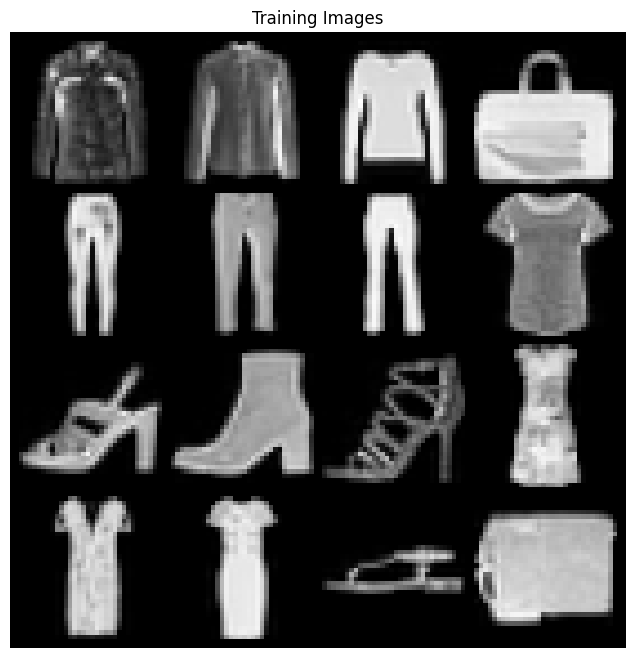

In [3]:
for i, (image, _) in enumerate(tqdm(dataloader)): # image 의 label은 쓰지 않아서 _ 처리 했다.
  # Plot some training images
  plt.figure(figsize=(8,8))
  plt.axis("off")
  plt.title("Training Images")
  plt.imshow(vutils.make_grid(image[:16], padding=2, normalize=True, nrow=4).permute(1,2,0)) # (4,4)로 만들어줌.
  break

In [4]:
print(image.min(), image.max()) # --> normalized image range 가 수정되었습니다

tensor(-1.) tensor(1.)


In [5]:
class Generator(nn.Module):
    def __init__(self):
        super(Generator, self).__init__()
        self.main = nn.Sequential(
            # input is Z, going into a convolution
            nn.ConvTranspose2d( nz, ngf * 4, 4, 1, 0, bias=False), # ngf 에 따라 채널 수를 결정한다.
            nn.BatchNorm2d(ngf * 4),
            nn.ReLU(True),
            # state size. 4 x 4
            nn.ConvTranspose2d(ngf * 4, ngf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 2),
            nn.ReLU(True),
            # state size. 8 x 8
            nn.ConvTranspose2d( ngf * 2, ngf, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf),
            nn.ReLU(True),
            # state size. 16 x 16
            nn.ConvTranspose2d( ngf, nc, 4, 2, 1, bias=False),
            nn.Tanh()
            # state size. (nc) x 32 x 32
        )

    def forward(self, input):
        return self.main(input)

netG = Generator().to(device)
print(netG)


Generator(
  (main): Sequential(
    (0): ConvTranspose2d(100, 256, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU(inplace=True)
    (9): ConvTranspose2d(64, 1, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (10): Tanh()
  )
)


In [6]:
class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()
        self.main = nn.ModuleList([
            # input is (nc) x 32 x 32
            nn.Conv2d(nc, ndf, 4, 2, 1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf) x 16 x 16
            nn.Conv2d(ndf, ndf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 2),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf*2) x 8 x 8
            nn.Conv2d(ndf * 2, ndf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 4),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf*4) x 4 x 4
            nn.Conv2d(ndf * 4, 1, 4, 1, 0, bias=False),
            nn.Sigmoid()
        ])

    def forward(self, x):
        for layer in self.main:
          x = layer(x)
        return x

netD = Discriminator().to(device)
print(netD)


Discriminator(
  (main): ModuleList(
    (0): Conv2d(1, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
    (2): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (3): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (4): LeakyReLU(negative_slope=0.2, inplace=True)
    (5): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (6): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (7): LeakyReLU(negative_slope=0.2, inplace=True)
    (8): Conv2d(256, 1, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (9): Sigmoid()
  )
)


In [7]:
# Initialize BCELoss function
criterion = nn.BCELoss()

# Create batch of latent vectors that we will use to visualize
#  the progression of the generator
fixed_noise = torch.randn(64, nz, 1, 1, device=device)

# Establish convention for real and fake labels during training
real_label = 1.
fake_label = 0.

# Setup Adam optimizers for both G and D
optimizerD = torch.optim.Adam(netD.parameters(), lr=0.0002, betas=(0.5, 0.999))
optimizerG = torch.optim.Adam(netG.parameters(), lr=0.0002, betas=(0.5, 0.999))

In [8]:
# Training Loop

# Lists to keep track of progress
img_list = []
G_losses = []
D_losses = []
iters = 0

print("Starting Training Loop...")


# For each epoch
for epoch in range(num_epochs):
    # For each batch in the dataloader
    for i, (image, _) in enumerate(tqdm(dataloader)):
        image = image.to(device)
        ############################
        # (1) Update D network: maximize log(D(x)) + log(1 - D(G(z)))
        ###########################
        ## Train with all-real batch
        netD.zero_grad()
        bs = image.size(0)
        label = torch.full((bs,), real_label, dtype=torch.float, device=device)
        output = netD(image).view(-1)
        errD_real = criterion(output, label)
        errD_real.backward()

        D_x = output.mean().item()

        ## Train with all-fake batch
        # Generate batch of latent vectors
        noise = torch.randn(bs, nz, 1, 1, device=device)
        # Generate fake image batch with G
        fake = netG(noise)
        label.fill_(fake_label)

        # Classify all fake batch with D
        output = netD(fake.detach()).view(-1)

        # Calculate D's loss on the all-fake batch
        errD_fake = criterion(output, label)

        # Calculate the gradients for this batch, accumulated (summed) with previous gradients
        errD_fake.backward()
        D_G_z1 = output.mean().item()
        # Compute error of D as sum over the fake and the real batches
        errD = errD_real + errD_fake
        # Update D
        optimizerD.step()

        ############################
        # (2) Update G network: maximize log(D(G(z)))
        ###########################
        netG.zero_grad()
        label.fill_(real_label)
        # Since we just updated D, perform another forward pass of all-fake batch through D
        output = netD(fake).view(-1)

        # Calculate G's loss based on this output
        errG = criterion(output, label)
        # Calculate gradients for G
        errG.backward()
        D_G_z2 = output.mean().item()
        # Update G
        optimizerG.step()

        # Output training stats
        if i % 50 == 0:
            print('[%d/%d][%d/%d]\tLoss_D: %.4f\tLoss_G: %.4f\tD(x): %.4f\tD(G(z)): %.4f / %.4f'
                  % (epoch, num_epochs, i, len(dataloader),
                     errD.item(), errG.item(), D_x, D_G_z1, D_G_z2))

        # Save Losses for plotting later
        G_losses.append(errG.item())
        D_losses.append(errD.item())

        # Check how the generator is doing by saving G's output on fixed_noise
        if (iters % 100 == 0) or ((epoch == num_epochs-1) and (i == len(dataloader)-1)):
            with torch.no_grad():
                fake = netG(fixed_noise).detach().cpu()
            img_list.append(vutils.make_grid(fake, padding=2, normalize=True))

        iters += 1

Starting Training Loop...


  0%|          | 0/938 [00:00<?, ?it/s]

[0/3][0/938]	Loss_D: 1.3992	Loss_G: 1.2515	D(x): 0.4916	D(G(z)): 0.4773 / 0.2922
[0/3][50/938]	Loss_D: 0.0126	Loss_G: 5.7393	D(x): 0.9965	D(G(z)): 0.0090 / 0.0034
[0/3][100/938]	Loss_D: 0.0055	Loss_G: 6.5218	D(x): 0.9985	D(G(z)): 0.0039 / 0.0016
[0/3][150/938]	Loss_D: 0.6252	Loss_G: 4.1117	D(x): 0.6226	D(G(z)): 0.0295 / 0.0214
[0/3][200/938]	Loss_D: 0.9397	Loss_G: 5.4439	D(x): 0.9374	D(G(z)): 0.5538 / 0.0053
[0/3][250/938]	Loss_D: 0.4431	Loss_G: 3.7223	D(x): 0.9063	D(G(z)): 0.2735 / 0.0300
[0/3][300/938]	Loss_D: 0.3111	Loss_G: 2.7972	D(x): 0.7673	D(G(z)): 0.0224 / 0.0845
[0/3][350/938]	Loss_D: 1.2097	Loss_G: 1.2327	D(x): 0.3834	D(G(z)): 0.0111 / 0.3375
[0/3][400/938]	Loss_D: 0.6394	Loss_G: 2.9653	D(x): 0.9201	D(G(z)): 0.3658 / 0.0740
[0/3][450/938]	Loss_D: 0.5741	Loss_G: 4.9228	D(x): 0.9766	D(G(z)): 0.4001 / 0.0107
[0/3][500/938]	Loss_D: 0.3416	Loss_G: 2.5081	D(x): 0.8454	D(G(z)): 0.1435 / 0.1012
[0/3][550/938]	Loss_D: 0.5232	Loss_G: 2.1186	D(x): 0.7958	D(G(z)): 0.2316 / 0.1502
[0/3][6

  0%|          | 0/938 [00:00<?, ?it/s]

[1/3][0/938]	Loss_D: 1.0711	Loss_G: 3.2801	D(x): 0.8808	D(G(z)): 0.5666 / 0.0583
[1/3][50/938]	Loss_D: 0.5958	Loss_G: 1.8917	D(x): 0.8466	D(G(z)): 0.3202 / 0.1707
[1/3][100/938]	Loss_D: 0.5452	Loss_G: 1.9666	D(x): 0.7248	D(G(z)): 0.1701 / 0.1703
[1/3][150/938]	Loss_D: 1.0336	Loss_G: 1.4040	D(x): 0.4526	D(G(z)): 0.0504 / 0.2916
[1/3][200/938]	Loss_D: 0.4992	Loss_G: 1.8860	D(x): 0.6780	D(G(z)): 0.0667 / 0.1972
[1/3][250/938]	Loss_D: 0.5487	Loss_G: 1.7252	D(x): 0.7309	D(G(z)): 0.1718 / 0.2184
[1/3][300/938]	Loss_D: 0.2674	Loss_G: 2.0938	D(x): 0.8369	D(G(z)): 0.0721 / 0.1464
[1/3][350/938]	Loss_D: 1.2816	Loss_G: 5.8953	D(x): 0.9801	D(G(z)): 0.6734 / 0.0065
[1/3][400/938]	Loss_D: 0.5168	Loss_G: 3.6270	D(x): 0.9560	D(G(z)): 0.3568 / 0.0319
[1/3][450/938]	Loss_D: 0.5072	Loss_G: 1.8736	D(x): 0.7407	D(G(z)): 0.1617 / 0.1712
[1/3][500/938]	Loss_D: 0.3527	Loss_G: 2.3770	D(x): 0.7686	D(G(z)): 0.0587 / 0.1180
[1/3][550/938]	Loss_D: 1.1794	Loss_G: 2.5927	D(x): 0.8721	D(G(z)): 0.5538 / 0.1058
[1/3][6

  0%|          | 0/938 [00:00<?, ?it/s]

[2/3][0/938]	Loss_D: 0.0723	Loss_G: 5.5682	D(x): 0.9362	D(G(z)): 0.0034 / 0.0057
[2/3][50/938]	Loss_D: 1.5146	Loss_G: 0.9568	D(x): 0.2900	D(G(z)): 0.0333 / 0.4850
[2/3][100/938]	Loss_D: 0.4860	Loss_G: 3.0407	D(x): 0.9152	D(G(z)): 0.3051 / 0.0569
[2/3][150/938]	Loss_D: 0.0914	Loss_G: 5.3149	D(x): 0.9215	D(G(z)): 0.0072 / 0.0069
[2/3][200/938]	Loss_D: 0.0524	Loss_G: 3.7920	D(x): 0.9809	D(G(z)): 0.0322 / 0.0285
[2/3][250/938]	Loss_D: 0.0557	Loss_G: 3.9826	D(x): 0.9783	D(G(z)): 0.0326 / 0.0250
[2/3][300/938]	Loss_D: 0.0482	Loss_G: 4.2941	D(x): 0.9765	D(G(z)): 0.0227 / 0.0192
[2/3][350/938]	Loss_D: 0.6691	Loss_G: 1.8303	D(x): 0.7230	D(G(z)): 0.2391 / 0.1907
[2/3][400/938]	Loss_D: 0.8961	Loss_G: 0.8222	D(x): 0.4833	D(G(z)): 0.0558 / 0.4864
[2/3][450/938]	Loss_D: 0.5043	Loss_G: 2.8589	D(x): 0.8939	D(G(z)): 0.2922 / 0.0695
[2/3][500/938]	Loss_D: 0.1128	Loss_G: 3.6501	D(x): 0.9764	D(G(z)): 0.0829 / 0.0330
[2/3][550/938]	Loss_D: 0.6767	Loss_G: 4.6528	D(x): 0.9706	D(G(z)): 0.3988 / 0.0148
[2/3][6

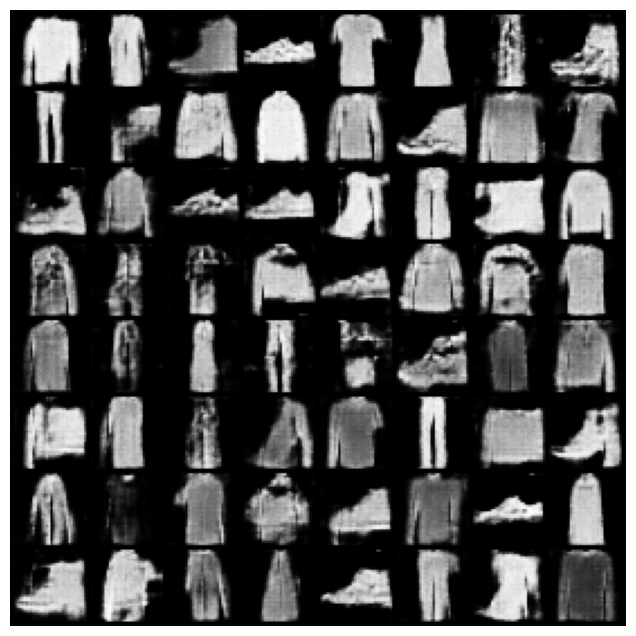

In [9]:
import matplotlib.animation as animation
from IPython.display import HTML

fig = plt.figure(figsize=(8,8))
plt.axis("off")
ims = [[plt.imshow(i.permute(1,2,0), animated=True)] for i in img_list]
ani = animation.ArtistAnimation(fig, ims, interval=1000, repeat_delay=1000, blit=True)

HTML(ani.to_jshtml())